In [6]:
import os
import os.path as osp
import importlib
from types import SimpleNamespace 

import copy


import nd2
import numpy as np

import torch
from torch.utils.data import DataLoader
from torch.utils.tensorboard import SummaryWriter

import segmentation_models_pytorch as smp
import segmentation_models_pytorch.utils
from torchinfo import summary

from pprint import pprint
import matplotlib.pyplot as plt
from tqdm import tqdm
import matplotlib
# matplotlib.use('TkAgg')

from cellseg_utils import (
    get_str_timestamp,
    get_squares,
    # unsplit_image,
    my_train_test_split,
    CellDataset,
    get_training_augmentation,
    get_validation_augmentation,
    get_preprocessing,
)

import cv2

In [2]:
params = dict(
    model_name='Unet',
    model_load_fp='out/MSC/Unet_20240415_145151/best_model.pth',

    dataset_dir='datasets/MSC/30_04_2023-LF1-P6-P21',
    masks_dir='datasets/MSC/30_04_2023-LF1-P6-P21_masks',
    ratio_train=0.6,
    ratio_val=0.2,

    square_a=256,
    border=32,
    classes=1,
    channels=2,
    num_workers=int(os.cpu_count()),
    batch_size=16,

    ENCODER='efficientnet-b0',  # 'timm-efficientnet-b8',  # 'efficientnet-b0', 'se_resnext50_32x4d'
    # ENCODER='timm-efficientnet-b8',  # 'timm-efficientnet-b8',  # 'efficientnet-b0', 'se_resnext50_32x4d'
    ENCODER_WEIGHTS='imagenet',
    IN_CHANNELS=2,
    ACTIVATION='sigmoid',  # could be None for logits or 'softmax2d' for multiclass segmentation
    DEVICE='cuda' if torch.cuda.is_available() else 'cpu',

    max_epochs=0,
    lr_first=1e-3,
    lr_last=1e-4,
)
pprint(params)
p = SimpleNamespace(**params)

{'ACTIVATION': 'sigmoid',
 'DEVICE': 'cuda',
 'ENCODER': 'efficientnet-b0',
 'ENCODER_WEIGHTS': 'imagenet',
 'IN_CHANNELS': 2,
 'batch_size': 16,
 'border': 32,
 'channels': 2,
 'classes': 1,
 'dataset_dir': 'datasets/MSC/30_04_2023-LF1-P6-P21',
 'lr_first': 0.001,
 'lr_last': 0.0001,
 'masks_dir': 'datasets/MSC/30_04_2023-LF1-P6-P21_masks',
 'max_epochs': 0,
 'model_load_fp': 'out/MSC/Unet_20240415_145151/best_model.pth',
 'model_name': 'Unet',
 'num_workers': 16,
 'ratio_train': 0.6,
 'ratio_val': 0.2,
 'square_a': 256}


In [3]:
fn_list = [v for v in os.listdir(p.dataset_dir) if v.endswith('.nd2')]
fn_list.sort()

W = H = 5
fp = osp.join(p.dataset_dir, fn_list[0])
np_data = nd2.imread(fp)
c, w, h = np_data.shape
figsize = (W*c + 1, H)

print(f'total images: {len(fn_list)}')
print(f'image shape (c, w, h): {np_data.shape}')

orig_size = (w, h)
square_w, square_h = p.square_a, p.square_a
square_size = (square_w, square_h)

full_size, full_size_with_borders, squares = get_squares(orig_size,
                                                         square_size,
                                                         p.border)

print(f'orig_size: {orig_size}')
print(f'full_size: {full_size}')
print(f'full_size_with_borders: {full_size_with_borders}')
# pprint(core_square_sizes)
print(f'squares: {len(squares)}')

pprint(squares[:2])
print('...')
pprint(squares[-2:])

images_fps = list()
masks_fps = list()
for fn in fn_list[:]:
    images_fps.append(osp.join(p.dataset_dir, fn))
    masks_fps.append(osp.join(p.masks_dir, f'{fn}mask.png'))
images_fps = np.array(images_fps)
masks_fps = np.array(masks_fps)

run_clear_ml = False

timestamp = get_str_timestamp()

log_dir = f'out/MSC/{p.model_name}_{timestamp}'
os.makedirs(log_dir)

total images: 235
image shape (c, w, h): (2, 1024, 1024)
orig_size: (1024, 1024)
full_size: (1024, 1024)
full_size_with_borders: (1088, 1088)
squares: 16
[{'h': 0,
  'square_coords': [0, 0, 256, 256],
  'square_with_borders_coords': [0, 0, 320, 320],
  'square_with_borders_coords_rev': [32, 32, 288, 288],
  'w': 0},
 {'h': 1,
  'square_coords': [0, 256, 256, 512],
  'square_with_borders_coords': [0, 256, 320, 576],
  'square_with_borders_coords_rev': [32, 288, 288, 544],
  'w': 0}]
...
[{'h': 2,
  'square_coords': [768, 512, 1024, 768],
  'square_with_borders_coords': [768, 512, 1088, 832],
  'square_with_borders_coords_rev': [800, 544, 1056, 800],
  'w': 3},
 {'h': 3,
  'square_coords': [768, 768, 1024, 1024],
  'square_with_borders_coords': [768, 768, 1088, 1088],
  'square_with_borders_coords_rev': [800, 800, 1056, 1056],
  'w': 3}]


In [4]:
ans = my_train_test_split(images_fps, masks_fps, p.ratio_train, p.ratio_val)
X_train, X_val, X_test, y_train, y_val, y_test = ans
print(X_train.shape, X_val.shape, X_test.shape)

# preprocessing_fn = smp.encoders.get_preprocessing_fn(p.ENCODER, p.ENCODER_WEIGHTS)
preprocessing_fn = None
preprocessing = get_preprocessing(preprocessing_fn)

if p.max_epochs != 0:
    train_dataset = CellDataset(X_train, y_train, squares,
                                p.border, p.channels, p.classes, full_size,
                                augmentation=get_training_augmentation(),
                                preprocessing=preprocessing)

    valid_dataset = CellDataset(X_val, y_val, squares,
                                p.border, p.channels, p.classes, full_size,
                                augmentation=get_training_augmentation(),
                                preprocessing=preprocessing)

test_dataset = CellDataset(X_test, y_test, squares,
                           p.border, p.channels, p.classes, full_size,
                           augmentation=get_validation_augmentation(),
                           preprocessing=preprocessing)

(141,) (47,) (47,)


47it [00:01, 24.41it/s]


In [7]:
a, b = next(iter(test_dataset))

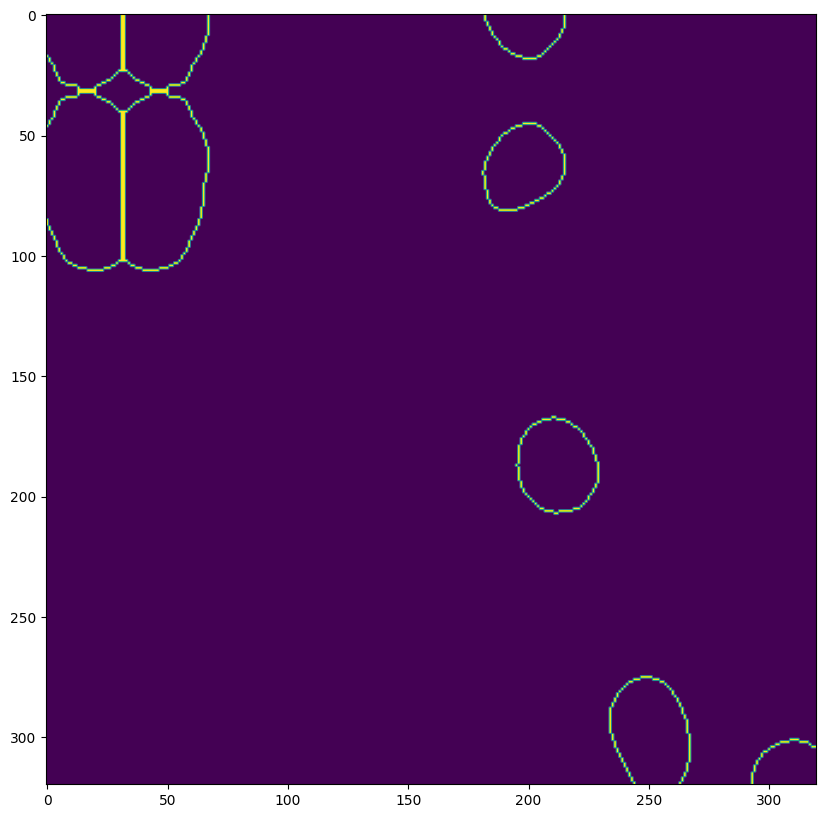

In [9]:
fig, ax = plt.subplots(1, 1, figsize=(10 , 10))
ax.imshow(b[1])

In [5]:
if p.max_epochs != 0:
    train_loader = DataLoader(train_dataset, batch_size=p.batch_size,
                              shuffle=True, num_workers=p.num_workers)
    valid_loader = DataLoader(valid_dataset, batch_size=p.batch_size,
                              shuffle=False, num_workers=p.num_workers)
test_loader = DataLoader(test_dataset, batch_size=1,
                         shuffle=False)

# create segmentation model with pretrained encoder
if p.model_load_fp is None:
    model_func = getattr(importlib.import_module('segmentation_models_pytorch'),
                         p.model_name)
    model = model_func(
        encoder_name=p.ENCODER,
        encoder_weights=p.ENCODER_WEIGHTS,
        in_channels=p.IN_CHANNELS,
        classes=p.classes,
        activation=p.ACTIVATION,
    )
    print('created new')
else:
    model = torch.load(p.model_load_fp)
    print(f'loaded {p.model_load_fp}')

summary(model)

# Dice/F1 score - https://en.wikipedia.org/wiki/S%C3%B8rensen%E2%80%93Dice_coefficient
# IoU/Jaccard score - https://en.wikipedia.org/wiki/Jaccard_index
loss = smp.utils.losses.DiceLoss()
metrics = [
    smp.utils.metrics.IoU(threshold=0.5),
]

optimizer = torch.optim.Adam([
    dict(params=model.parameters(), lr=p.lr_first),
])

# create epoch runners
# it is a simple loop of iterating over dataloader`s samples
train_epoch = smp.utils.train.TrainEpoch(
    model,
    loss=loss,
    metrics=metrics,
    optimizer=optimizer,
    device=p.DEVICE,
    verbose=True,
)
valid_epoch = smp.utils.train.ValidEpoch(
    model,
    loss=loss,
    metrics=metrics,
    device=p.DEVICE,
    verbose=True,
)

loaded out/MSC/Unet_20240415_145151/best_model.pth


In [6]:
# if p.max_epochs != 0:
gamma = pow(p.lr_last / p.lr_first, 1 / p.max_epochs) if p.max_epochs != 0 else 0
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=1, gamma=gamma, last_epoch=-1)

# TRAIN
if run_clear_ml:
    task = Task.init(project_name="CellSeg",
                     task_name=log_dir,
                     output_uri=True)
    task.connect(params)
writer = SummaryWriter(log_dir=log_dir)

max_score = 0
for epoch in range(0, p.max_epochs):
    print(f'Epoch: #{epoch} / {p.max_epochs}')
    writer.add_scalar('LR', optimizer.param_groups[0]['lr'], epoch)

    train_logs = train_epoch.run(train_loader)
    for k, v in train_logs.items():
        writer.add_scalar(f'{k}/train', v, epoch)
        # print(f"{' '.join(k.split('_')).title()}: {v:.2f}")

    valid_logs = valid_epoch.run(valid_loader)
    for k, v in valid_logs.items():
        writer.add_scalar(f'{k}/val', v, epoch)
        # print(f"{' '.join(k.split('_')).title()}: {v:.2f}")

    # do something (save model, change lr, etc.)
    if max_score < valid_logs['iou_score']:
        max_score = valid_logs['iou_score']
        torch.save(model, os.path.join(log_dir, 'best_model.pth'))
        print('Model saved!')

    scheduler.step()

In [7]:
# load best saved checkpoint
print('-' * 80)
print('TEST:')
best_model = model
# evaluate model on test set
test_epoch = smp.utils.train.ValidEpoch(
    model=best_model,
    loss=loss,
    metrics=metrics,
    device=p.DEVICE,
)

test_logs = test_epoch.run(test_loader)
for k, v in test_logs.items():
    print(f"{' '.join(k.split('_')).title()}: {v:.2f}")

--------------------------------------------------------------------------------
TEST:
valid: 100%|█| 752/752 [00:08<00:00, 86.93it/s, dice_loss - 0.1747, iou_score - 
Dice Loss: 0.17
Iou Score: 0.79


  0%|                                                   | 0/752 [00:00<?, ?it/s]

tensor(0.3929)


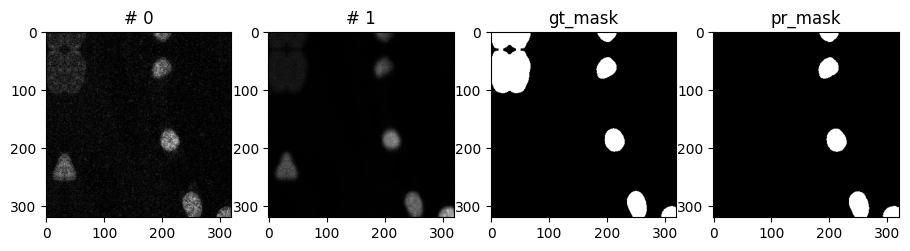

  0%|                                           | 1/752 [00:00<04:02,  3.09it/s]

tensor(0.9777)


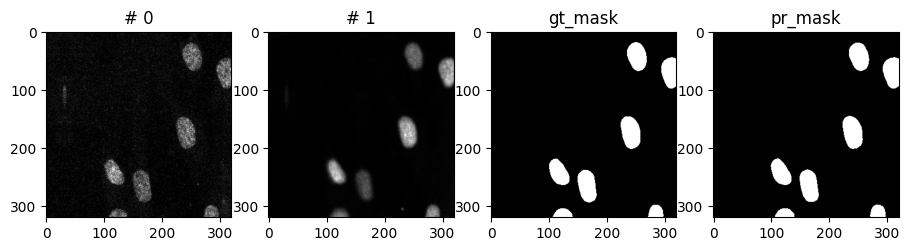

  0%|                                           | 2/752 [00:00<03:46,  3.31it/s]

tensor(0.9462)


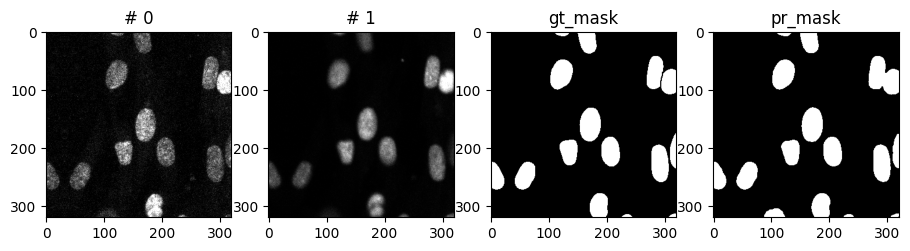

  0%|▏                                          | 3/752 [00:00<03:39,  3.41it/s]

tensor(0.6401)


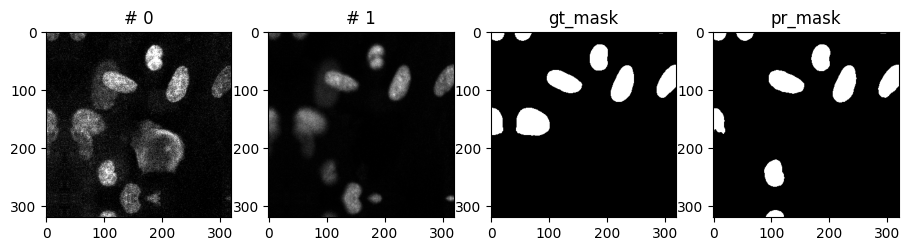

  1%|▏                                          | 4/752 [00:01<03:38,  3.42it/s]

tensor(0.7830)


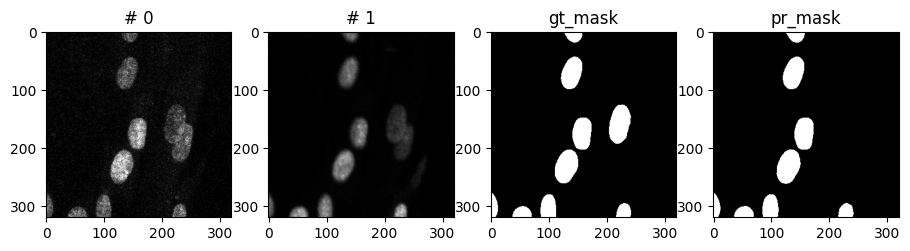

  1%|▎                                          | 5/752 [00:01<03:36,  3.45it/s]

tensor(0.7497)


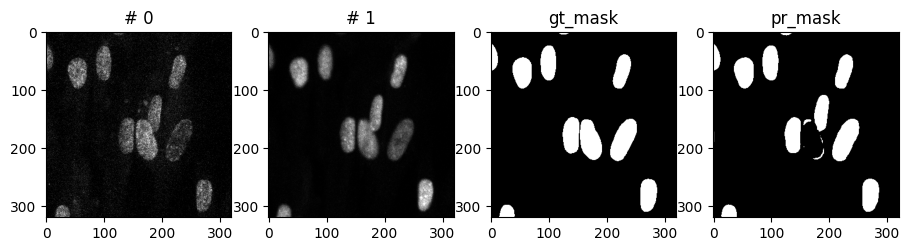

  1%|▎                                          | 6/752 [00:01<03:59,  3.11it/s]

tensor(0.8721)


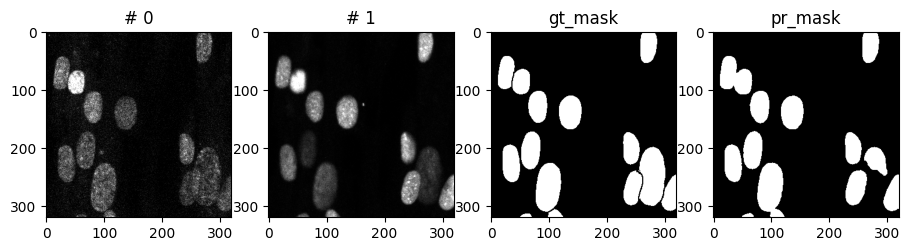

  1%|▍                                          | 7/752 [00:02<03:51,  3.21it/s]

tensor(0.7370)


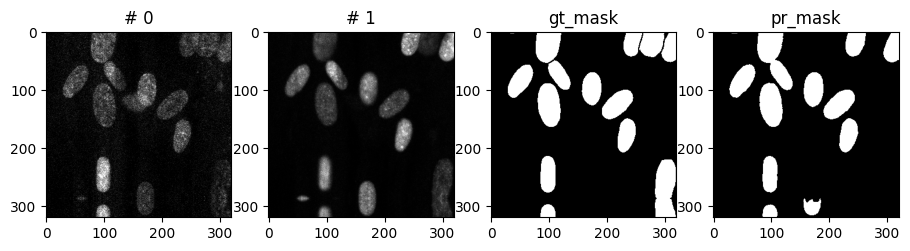

  1%|▍                                          | 8/752 [00:02<03:46,  3.28it/s]

tensor(0.8386)


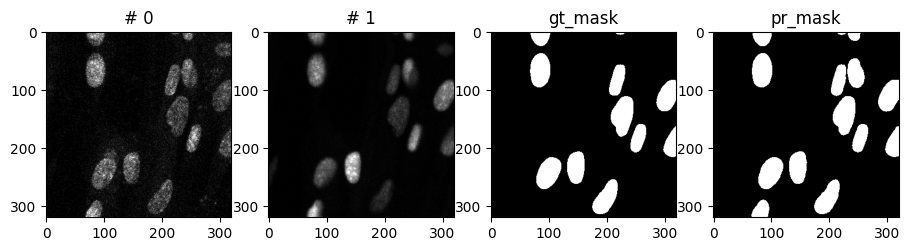

  1%|▌                                          | 9/752 [00:02<03:41,  3.36it/s]

tensor(0.9085)


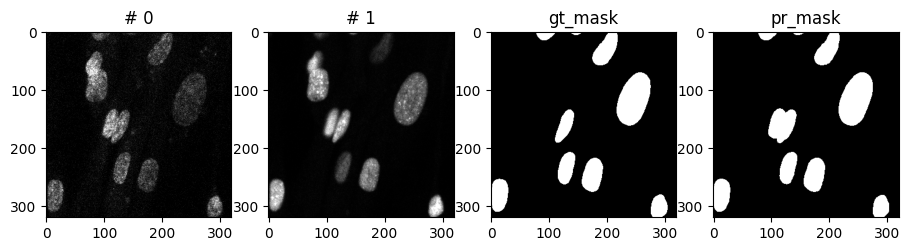

  1%|▌                                         | 10/752 [00:02<03:37,  3.41it/s]

tensor(0.8328)


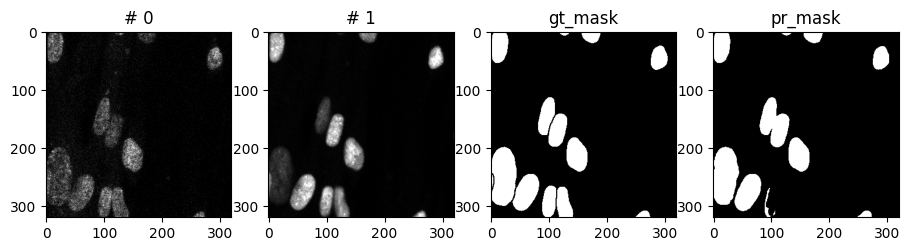

  1%|▌                                         | 11/752 [00:03<03:36,  3.43it/s]

tensor(0.8229)


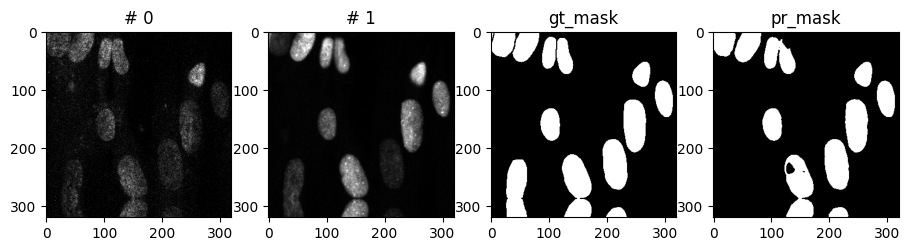

  2%|▋                                         | 12/752 [00:03<03:34,  3.45it/s]

tensor(0.9563)


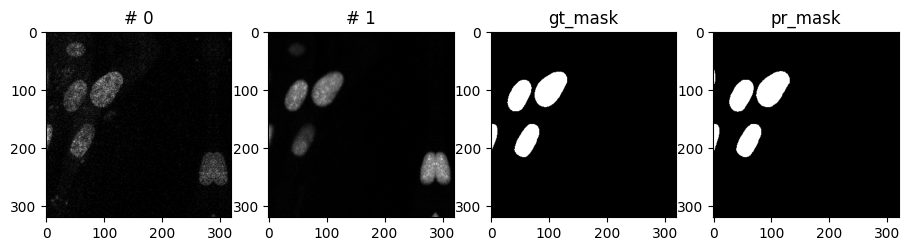

  2%|▋                                         | 13/752 [00:03<03:34,  3.45it/s]

tensor(0.7406)


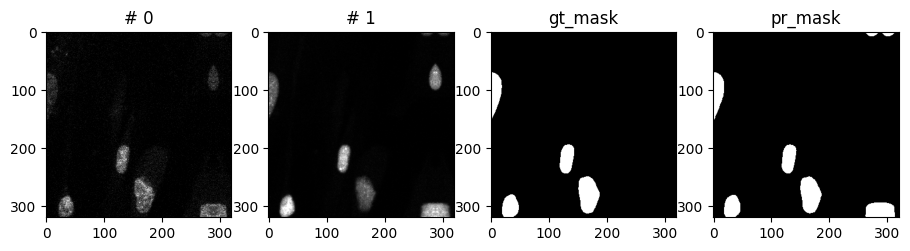

  2%|▊                                         | 14/752 [00:04<03:33,  3.46it/s]

tensor(0.7804)


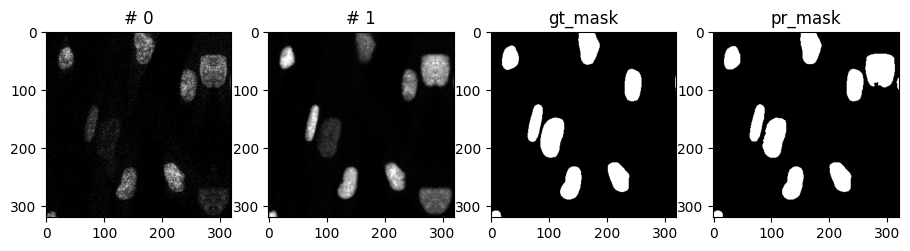

  2%|▊                                         | 15/752 [00:04<03:33,  3.45it/s]

tensor(0.7309)


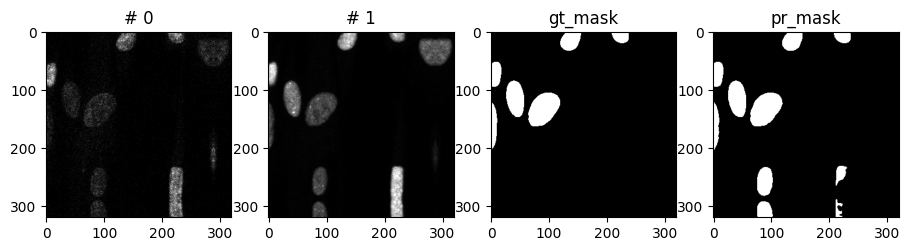

  2%|▉                                         | 16/752 [00:04<03:55,  3.12it/s]

tensor(0.6261)


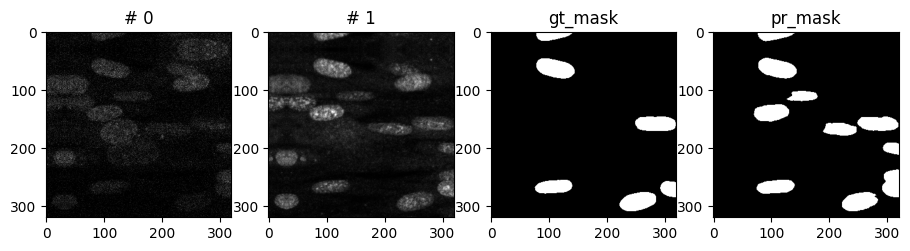

  2%|▉                                         | 17/752 [00:05<03:47,  3.23it/s]

tensor(0.8149)


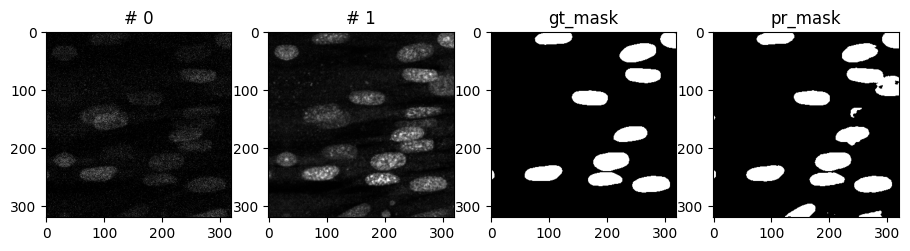

  2%|█                                         | 18/752 [00:05<03:41,  3.31it/s]

tensor(0.4752)


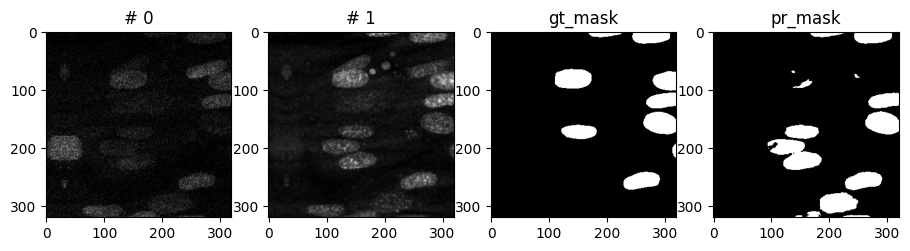

  3%|█                                         | 19/752 [00:05<03:37,  3.38it/s]

tensor(0.1035)


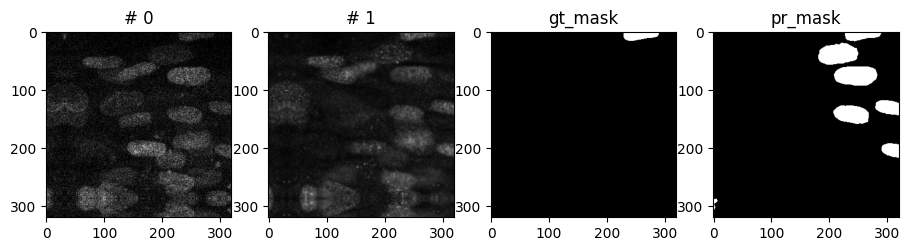

  3%|█                                         | 20/752 [00:05<03:35,  3.40it/s]

tensor(0.5667)


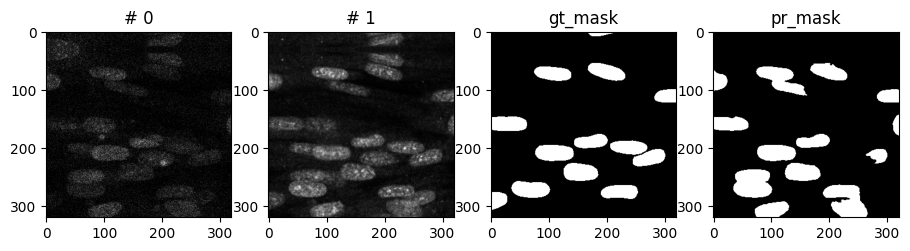

  3%|█▏                                        | 21/752 [00:06<03:33,  3.42it/s]

tensor(0.6189)


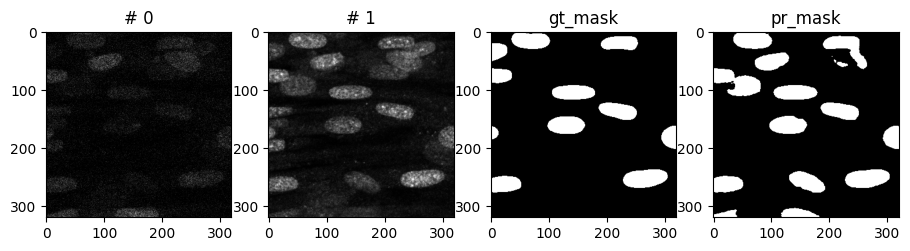

  3%|█▏                                        | 22/752 [00:06<03:32,  3.43it/s]

tensor(0.7749)


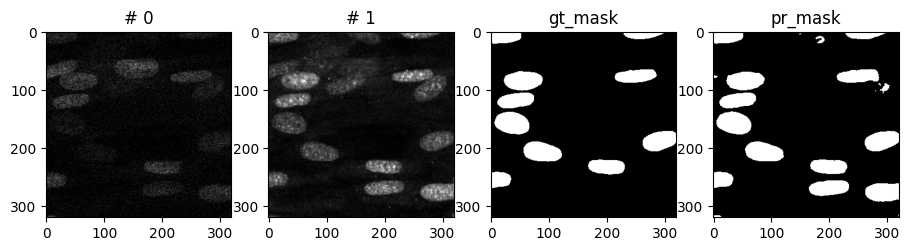

  3%|█▎                                        | 23/752 [00:06<03:31,  3.45it/s]

tensor(0.0249)


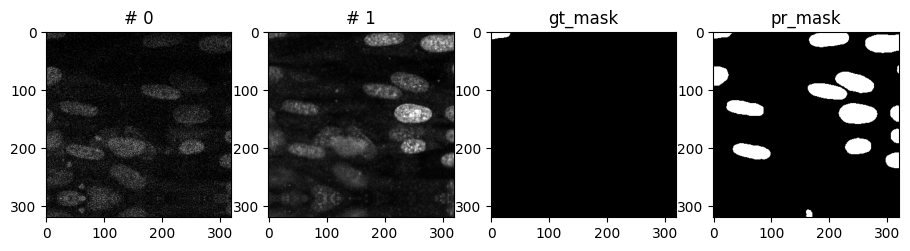

  3%|█▎                                        | 24/752 [00:07<03:30,  3.46it/s]

tensor(0.8027)


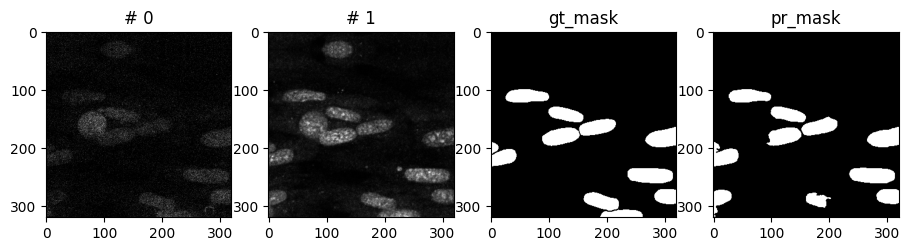

  3%|█▍                                        | 25/752 [00:07<03:36,  3.37it/s]

tensor(0.7311)


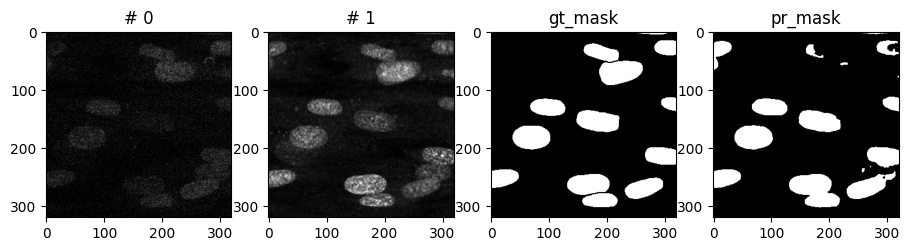

  3%|█▍                                        | 26/752 [00:07<03:59,  3.03it/s]

tensor(0.4239)


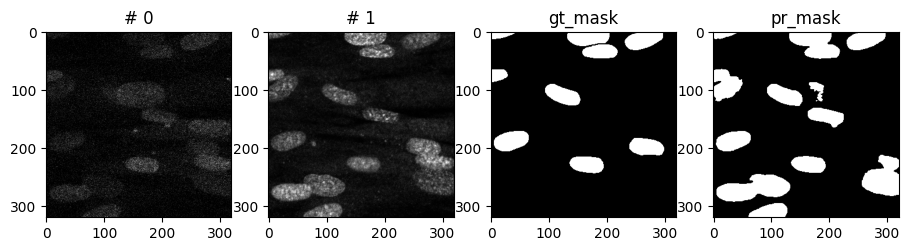

  4%|█▌                                        | 27/752 [00:08<03:50,  3.14it/s]

tensor(4.6564e-12)


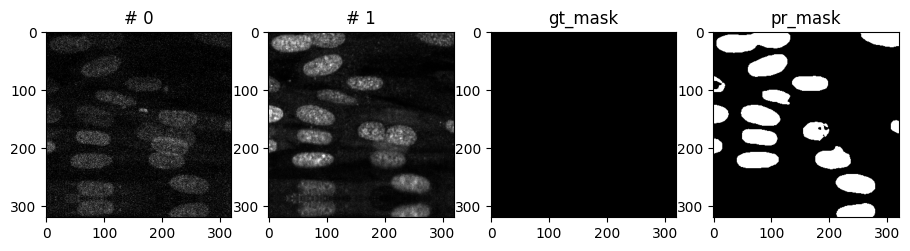

  4%|█▌                                        | 28/752 [00:08<03:44,  3.22it/s]

tensor(0.9033)


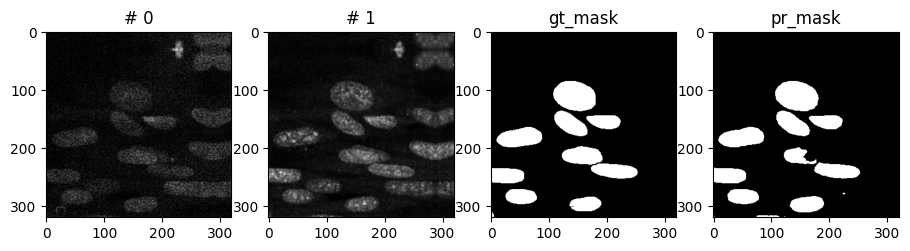

  4%|█▌                                        | 29/752 [00:08<03:39,  3.29it/s]

tensor(0.6822)


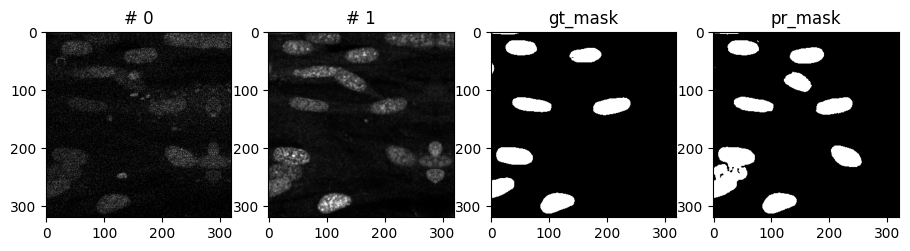

  4%|█▋                                        | 30/752 [00:09<03:35,  3.36it/s]

tensor(0.6088)


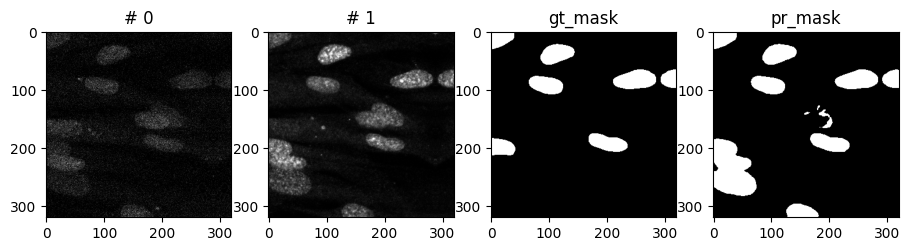

  4%|█▋                                        | 31/752 [00:09<03:32,  3.40it/s]

tensor(1.1673e-11)


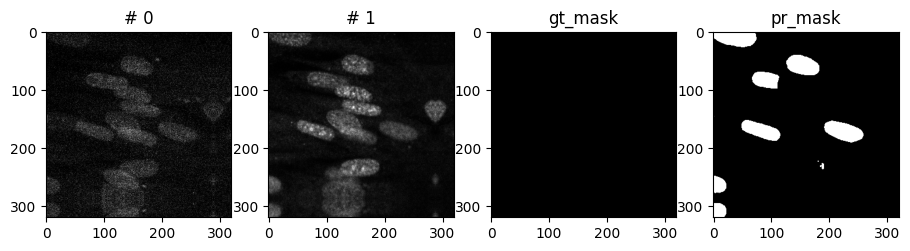

  4%|█▊                                        | 32/752 [00:09<03:30,  3.43it/s]

tensor(0.9798)


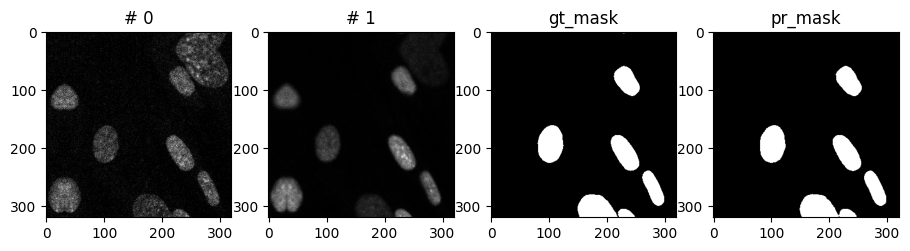

  4%|█▊                                        | 33/752 [00:09<03:27,  3.47it/s]

tensor(0.9761)


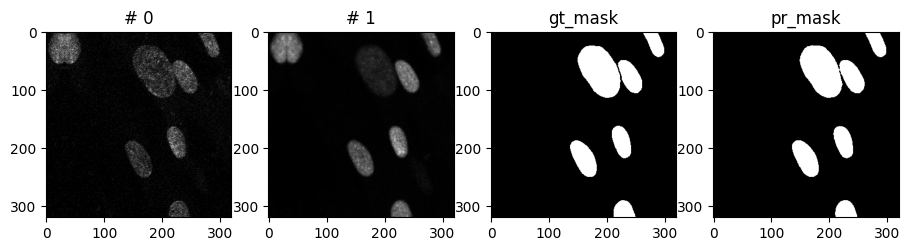

  5%|█▉                                        | 34/752 [00:10<03:24,  3.50it/s]

tensor(0.7597)


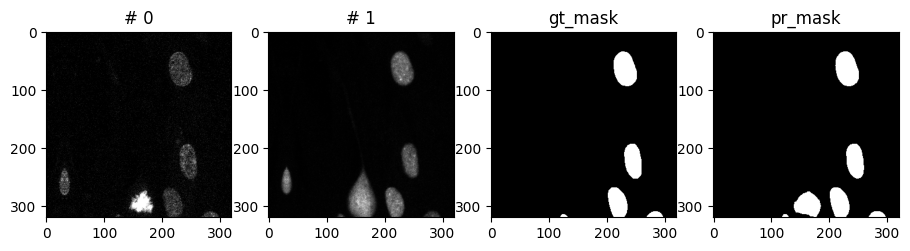

  5%|█▉                                        | 35/752 [00:10<03:23,  3.52it/s]

tensor(0.8617)


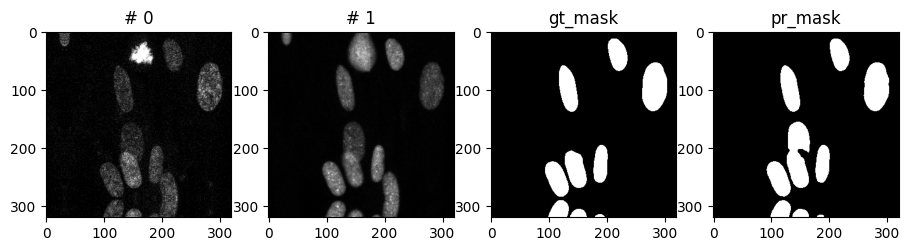

  5%|██                                        | 36/752 [00:10<03:45,  3.17it/s]

tensor(0.7668)


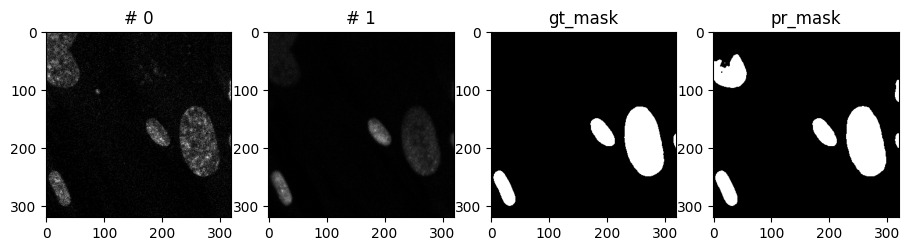

  5%|██                                        | 37/752 [00:11<03:37,  3.28it/s]

tensor(0.9764)


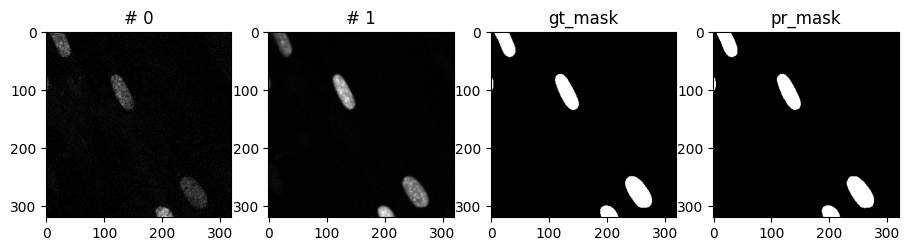

  5%|██                                        | 38/752 [00:11<03:32,  3.36it/s]

tensor(0.9749)


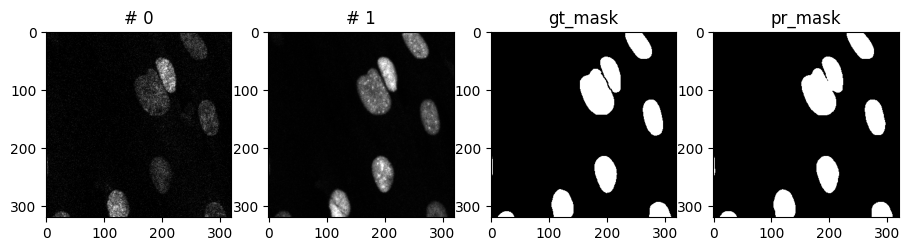

  5%|██▏                                       | 39/752 [00:11<03:30,  3.38it/s]

tensor(0.9807)


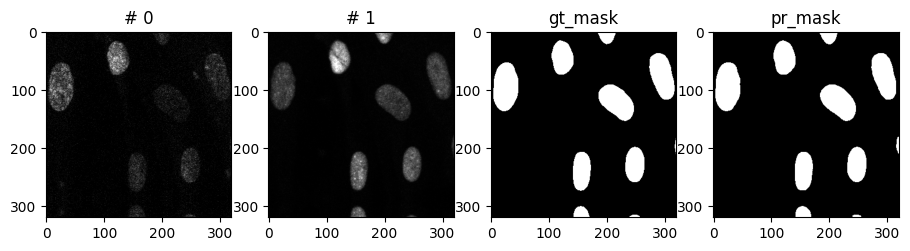

  5%|██▏                                       | 40/752 [00:11<03:27,  3.43it/s]

tensor(0.8415)


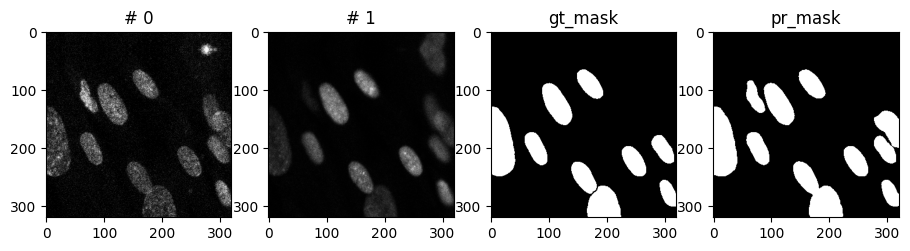

  5%|██▎                                       | 41/752 [00:12<03:26,  3.44it/s]

tensor(0.9783)


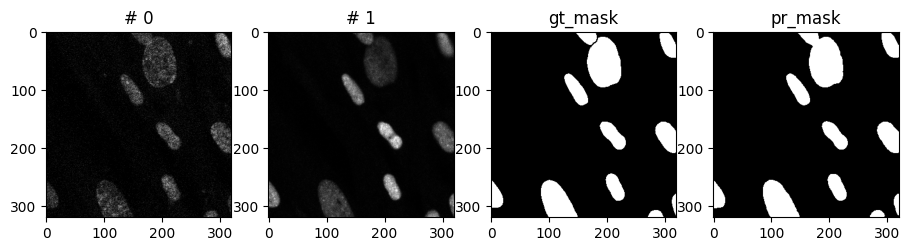

  6%|██▎                                       | 42/752 [00:12<03:25,  3.46it/s]

tensor(0.7428)


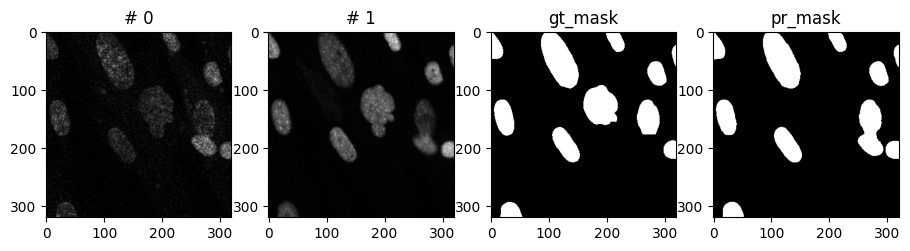

  6%|██▍                                       | 43/752 [00:12<03:24,  3.47it/s]

tensor(0.9806)


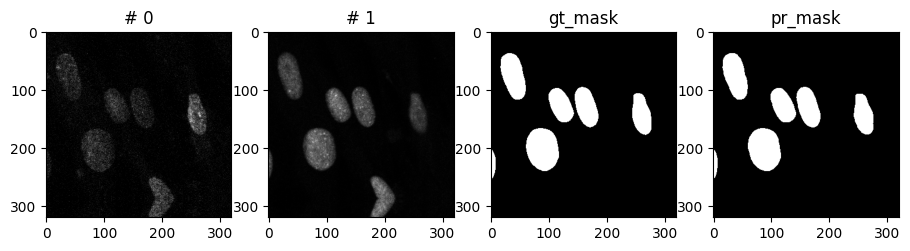

  6%|██▍                                       | 44/752 [00:13<03:22,  3.49it/s]

tensor(0.7928)


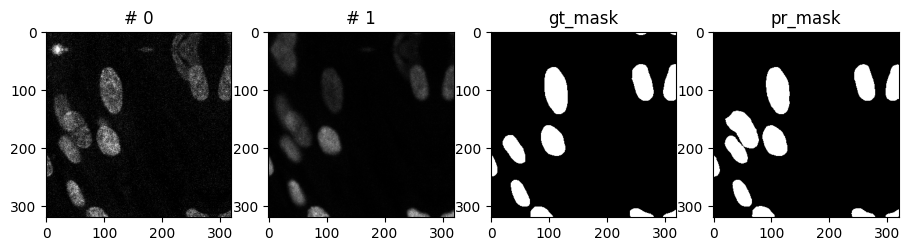

  6%|██▌                                       | 45/752 [00:13<03:22,  3.50it/s]

tensor(0.8535)


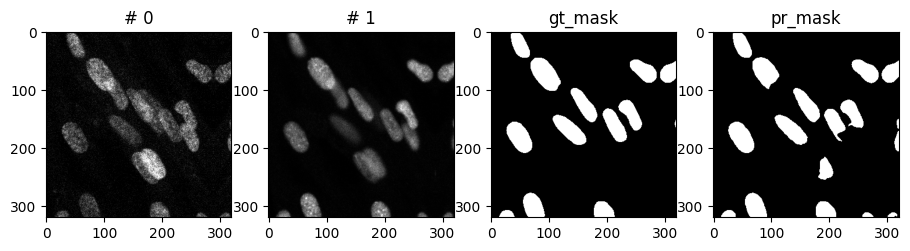

  6%|██▌                                       | 46/752 [00:13<03:48,  3.09it/s]

tensor(0.8385)


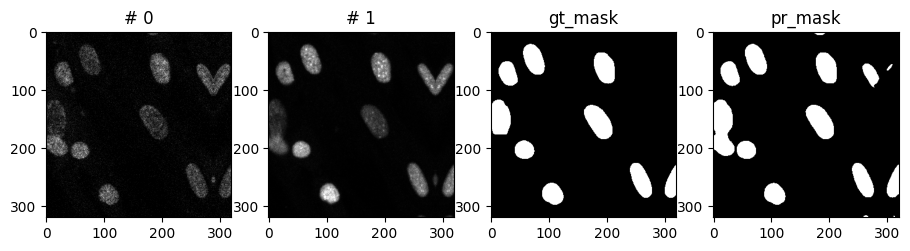

  6%|██▋                                       | 47/752 [00:14<03:39,  3.20it/s]

tensor(0.9796)


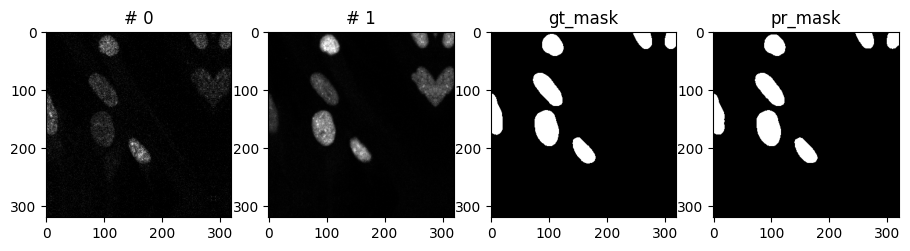

  6%|██▋                                       | 48/752 [00:14<03:35,  3.27it/s]

tensor(0.9534)


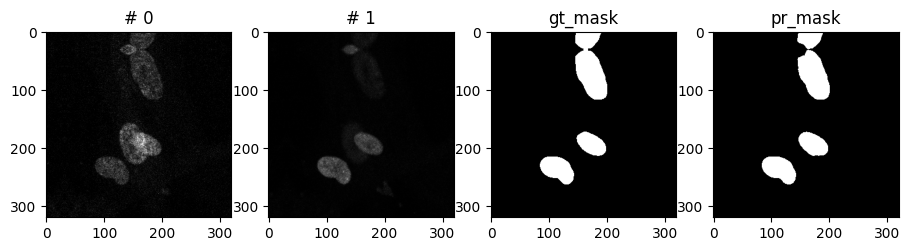

  7%|██▋                                       | 49/752 [00:14<03:31,  3.32it/s]

tensor(0.9828)


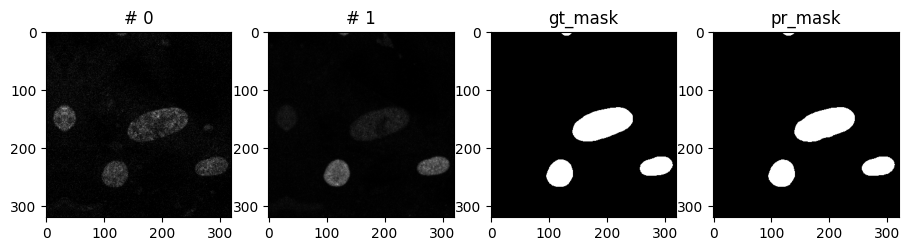

  7%|██▊                                       | 50/752 [00:14<03:28,  3.36it/s]

tensor(0.9677)


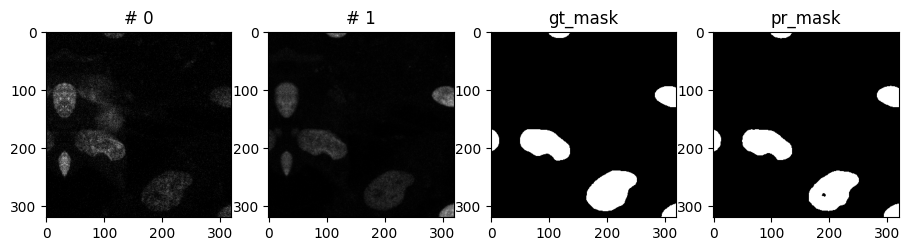

  7%|██▊                                       | 51/752 [00:15<03:26,  3.40it/s]

tensor(0.5549)


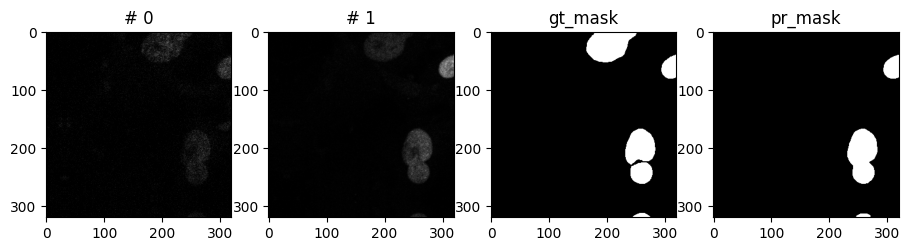

  7%|██▉                                       | 52/752 [00:15<03:23,  3.44it/s]

tensor(0.9788)


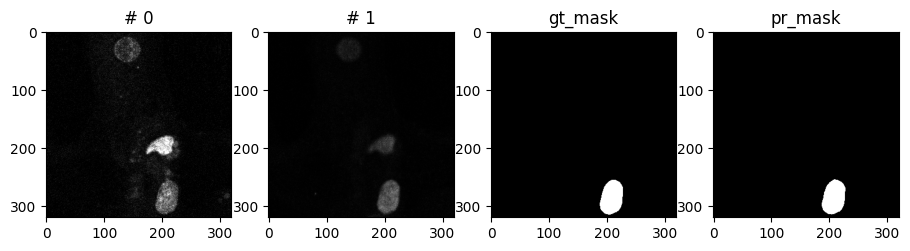

  7%|██▉                                       | 53/752 [00:15<03:24,  3.42it/s]

tensor(0.9870)


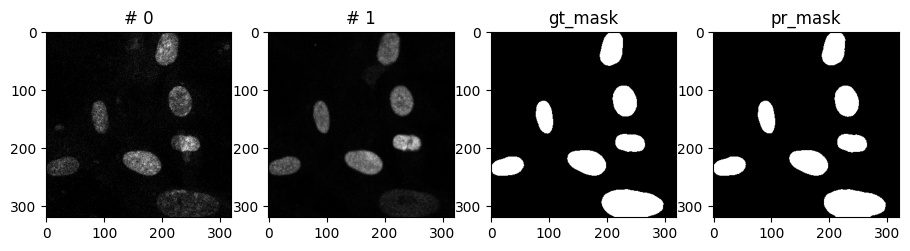

  7%|███                                       | 54/752 [00:16<03:22,  3.45it/s]

tensor(0.9838)


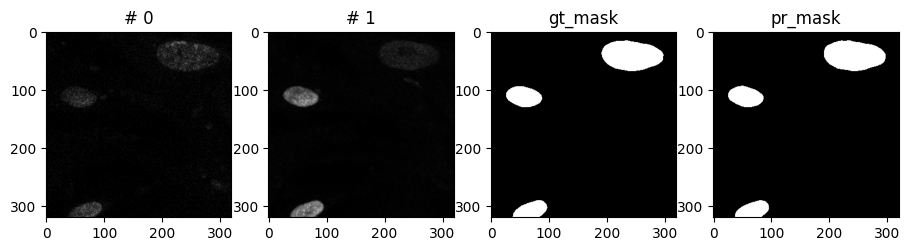

  7%|███                                       | 55/752 [00:16<03:22,  3.45it/s]

tensor(0.9748)


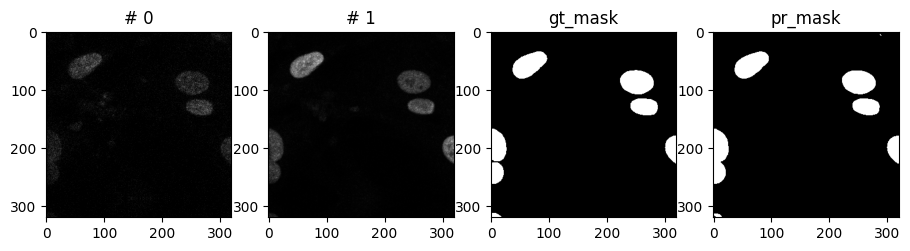

  7%|███▏                                      | 56/752 [00:16<03:46,  3.08it/s]

tensor(0.9799)


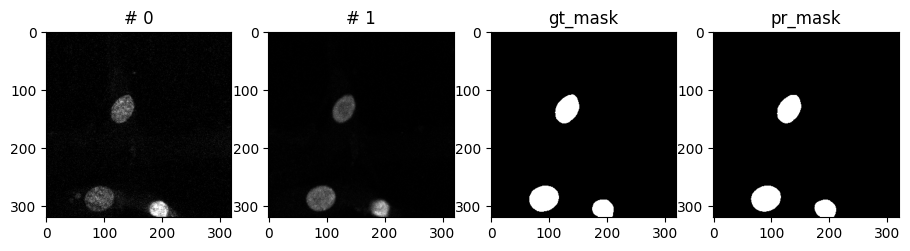

  8%|███▏                                      | 57/752 [00:17<03:37,  3.20it/s]

tensor(0.9676)


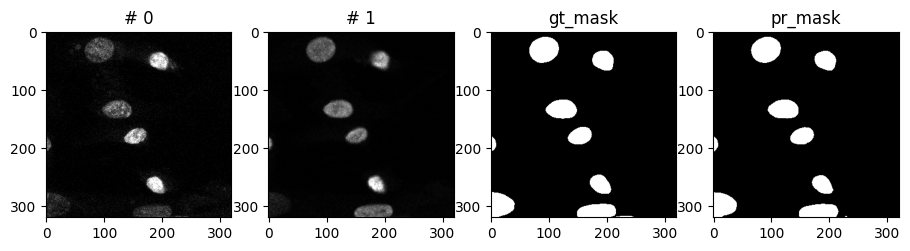

  8%|███▏                                      | 58/752 [00:17<03:32,  3.27it/s]

tensor(0.9749)


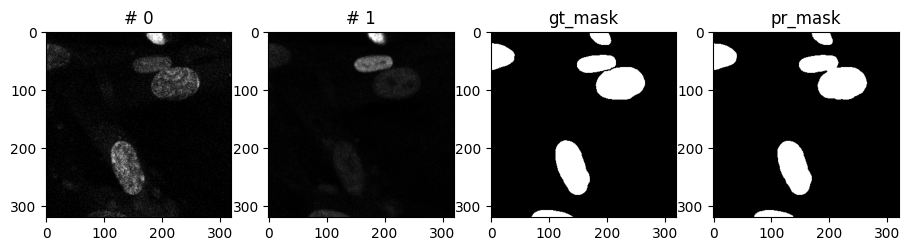

  8%|███▎                                      | 59/752 [00:17<03:28,  3.32it/s]

tensor(0.8410)


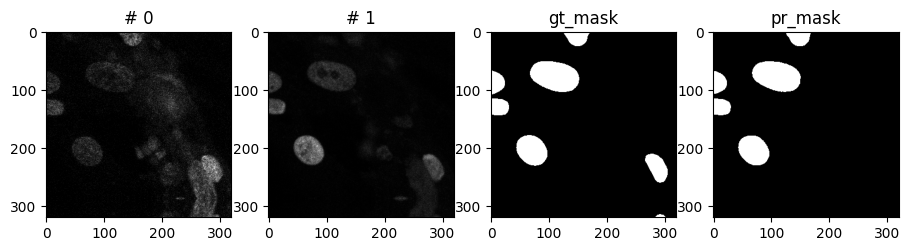

  8%|███▎                                      | 60/752 [00:17<03:24,  3.38it/s]

tensor(0.9535)


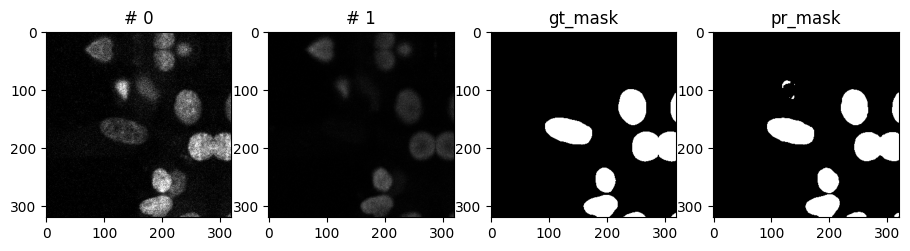

  8%|███▍                                      | 61/752 [00:18<03:22,  3.42it/s]

tensor(0.8817)


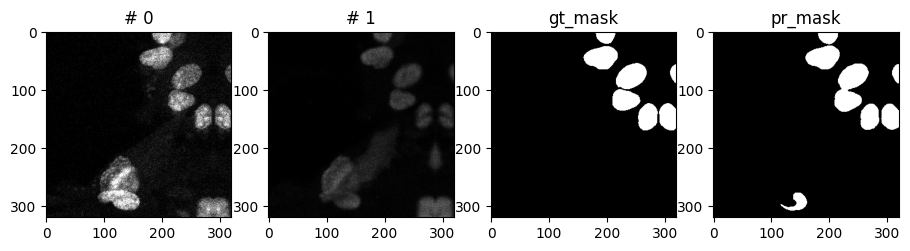

  8%|███▍                                      | 62/752 [00:18<03:20,  3.44it/s]

tensor(0.7406)


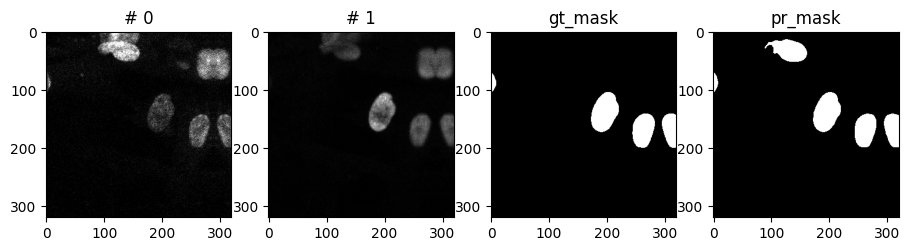

  8%|███▌                                      | 63/752 [00:18<03:20,  3.44it/s]

tensor(7.5815e-11)


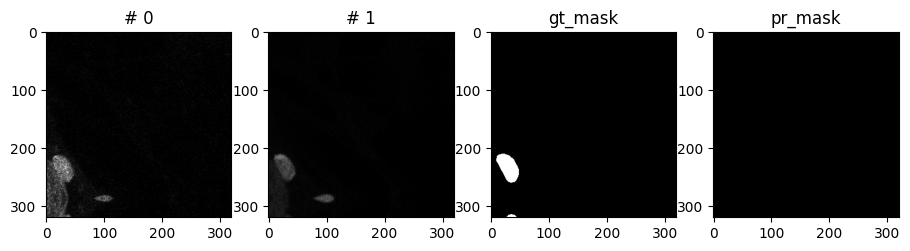

  9%|███▌                                      | 64/752 [00:19<03:19,  3.46it/s]

tensor(0.5131)


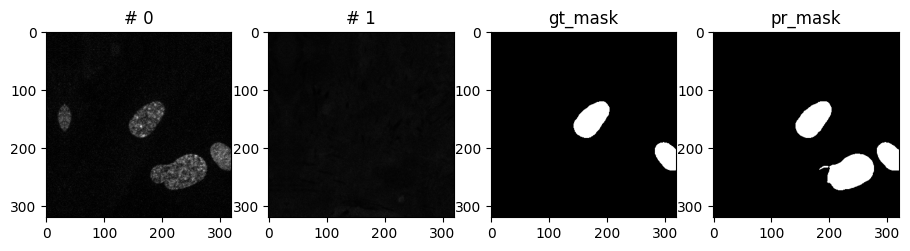

  9%|███▋                                      | 65/752 [00:19<03:20,  3.43it/s]

tensor(0.8493)


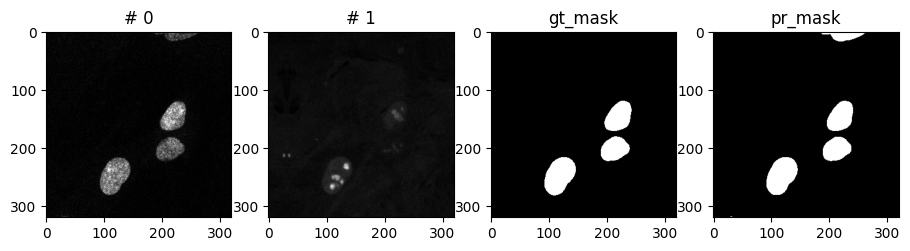

  9%|███▋                                      | 66/752 [00:19<03:43,  3.07it/s]

tensor(0.9844)


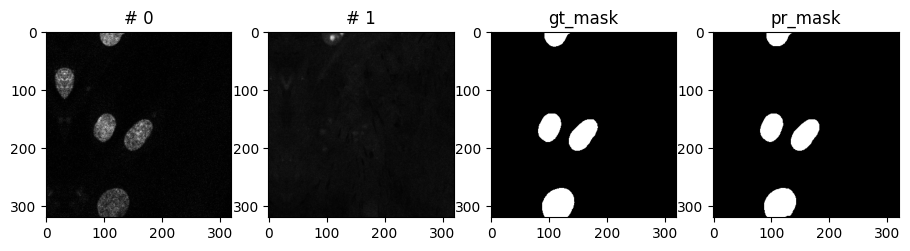

  9%|███▋                                      | 67/752 [00:20<03:36,  3.17it/s]

tensor(0.9821)


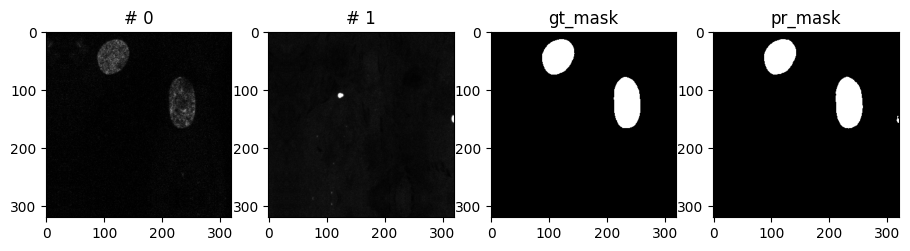

  9%|███▊                                      | 68/752 [00:20<03:30,  3.25it/s]

tensor(0.4357)


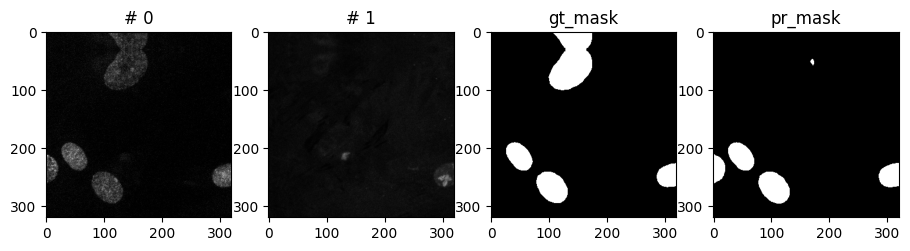

  9%|███▊                                      | 69/752 [00:20<03:26,  3.31it/s]

tensor(0.9623)


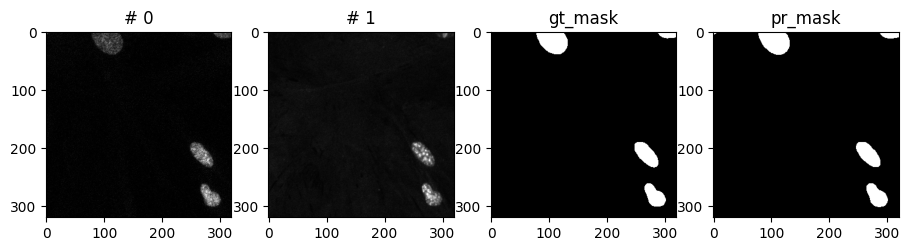

  9%|███▉                                      | 70/752 [00:20<03:22,  3.37it/s]

tensor(0.7785)


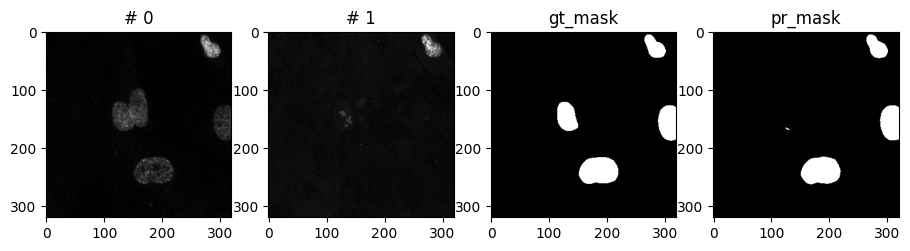

  9%|███▉                                      | 71/752 [00:21<03:22,  3.37it/s]

tensor(0.9426)


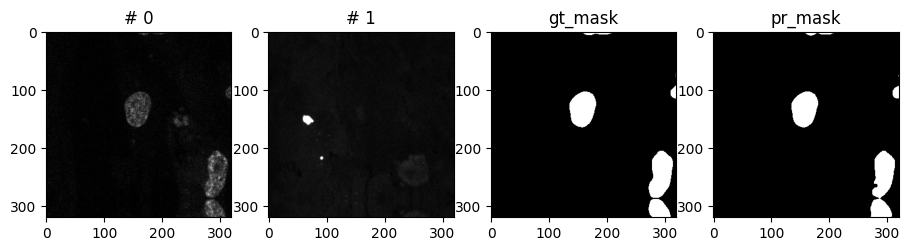

 10%|████                                      | 72/752 [00:21<03:21,  3.37it/s]

tensor(0.6075)


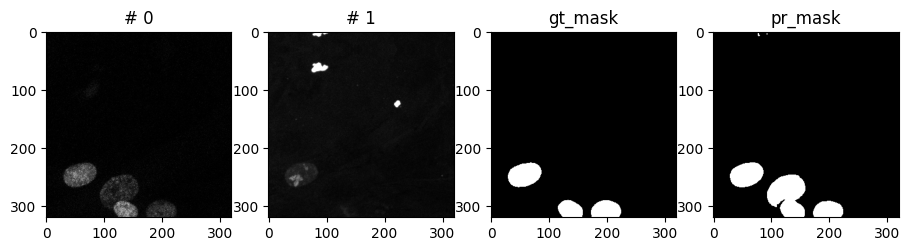

 10%|████                                      | 73/752 [00:21<03:19,  3.40it/s]

tensor(0.7737)


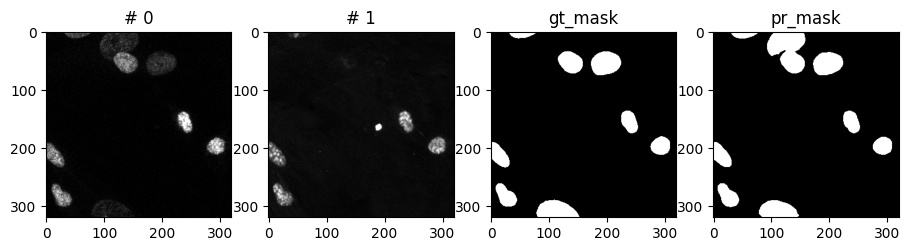

 10%|████▏                                     | 74/752 [00:22<03:18,  3.42it/s]

tensor(0.9767)


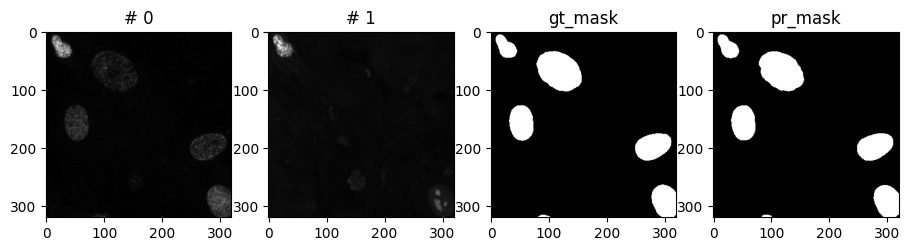

 10%|████▏                                     | 75/752 [00:22<03:18,  3.41it/s]

tensor(0.5852)


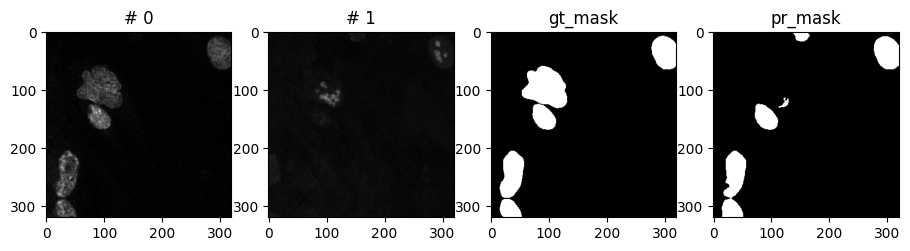

 10%|████▏                                     | 76/752 [00:22<03:41,  3.06it/s]

tensor(0.8032)


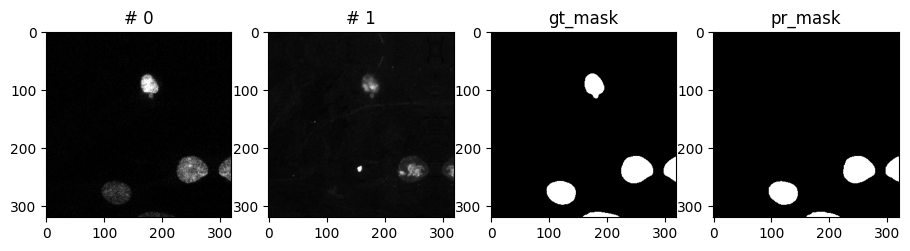

 10%|████▎                                     | 77/752 [00:23<03:33,  3.16it/s]

tensor(0.9741)


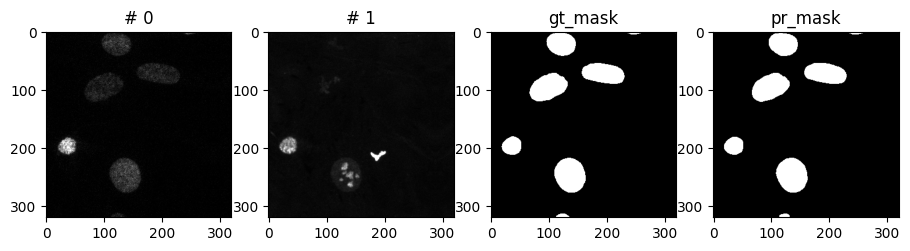

 10%|████▎                                     | 78/752 [00:23<03:27,  3.24it/s]

tensor(0.9810)


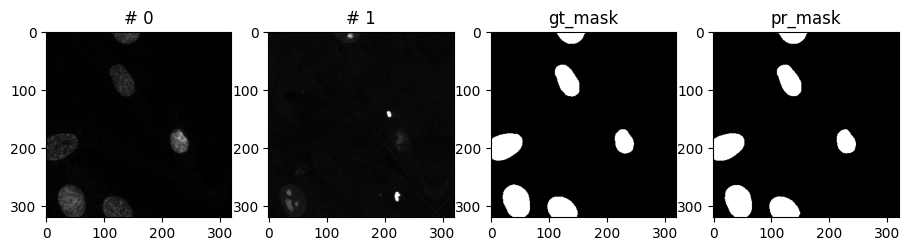

 11%|████▍                                     | 79/752 [00:23<03:23,  3.31it/s]

tensor(0.9814)


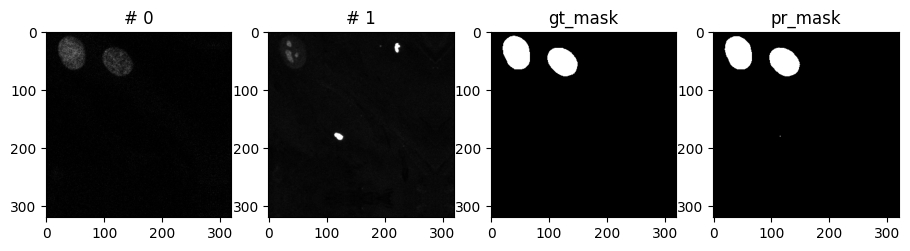

 11%|████▍                                     | 80/752 [00:23<03:19,  3.36it/s]

tensor(0.9572)


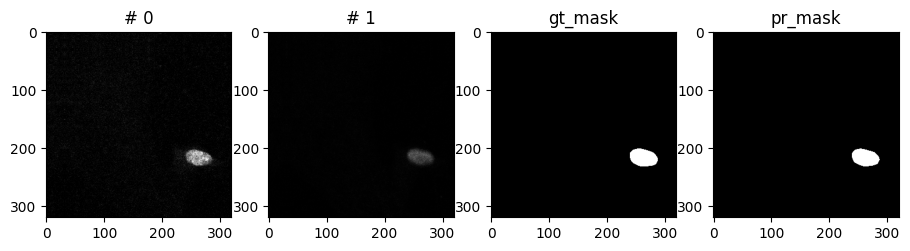

 11%|████▌                                     | 81/752 [00:24<03:17,  3.39it/s]

tensor(0.9807)


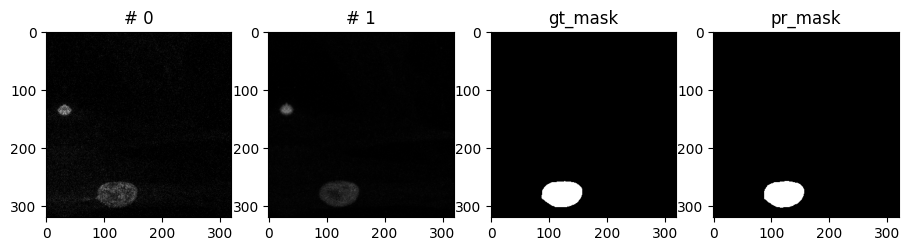

 11%|████▌                                     | 82/752 [00:24<03:16,  3.41it/s]

tensor(0.9807)


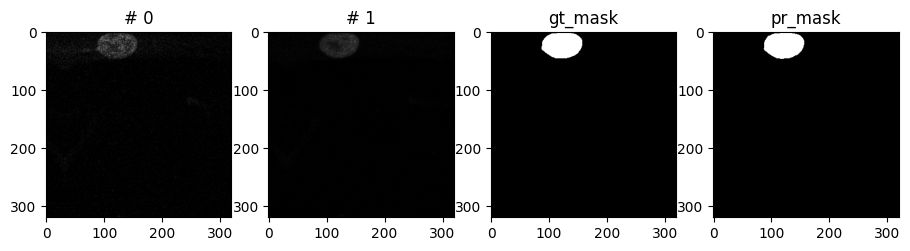

 11%|████▋                                     | 83/752 [00:24<03:15,  3.42it/s]

tensor(1.)


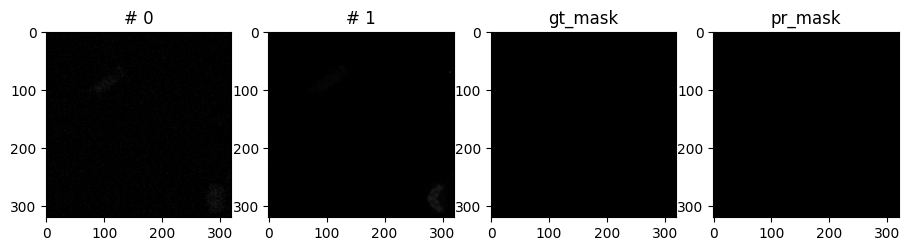

 11%|████▋                                     | 84/752 [00:25<03:14,  3.44it/s]

tensor(0.9776)


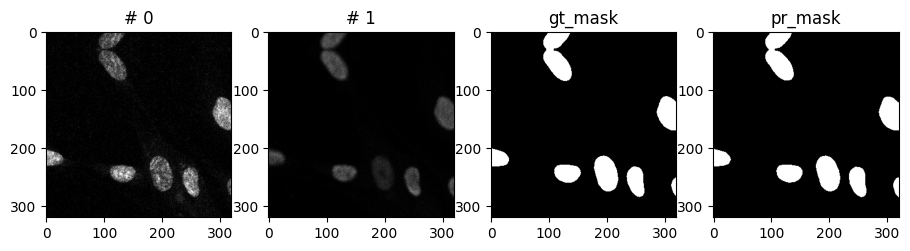

 11%|████▋                                     | 85/752 [00:25<03:16,  3.40it/s]

tensor(0.9734)


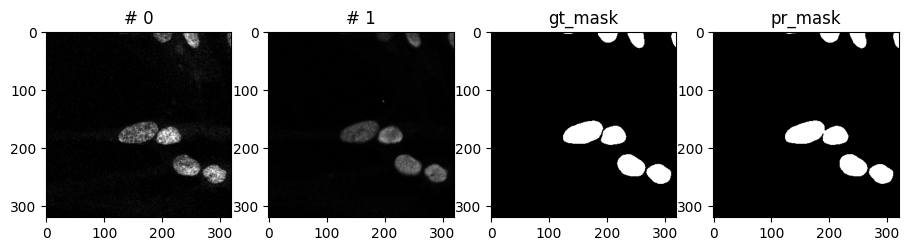

 11%|████▊                                     | 86/752 [00:25<03:41,  3.01it/s]

tensor(0.9808)


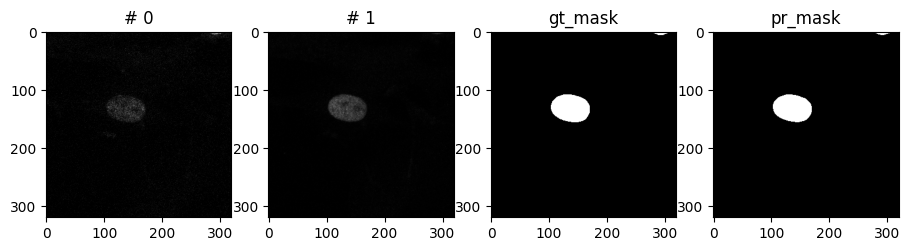

 12%|████▊                                     | 87/752 [00:26<03:31,  3.14it/s]

tensor(0.5824)


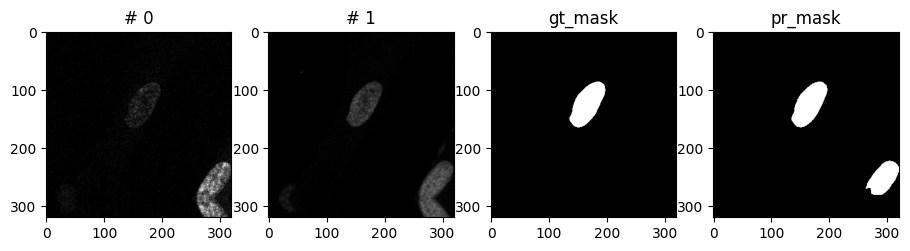

 12%|████▉                                     | 88/752 [00:26<03:25,  3.23it/s]

tensor(0.6196)


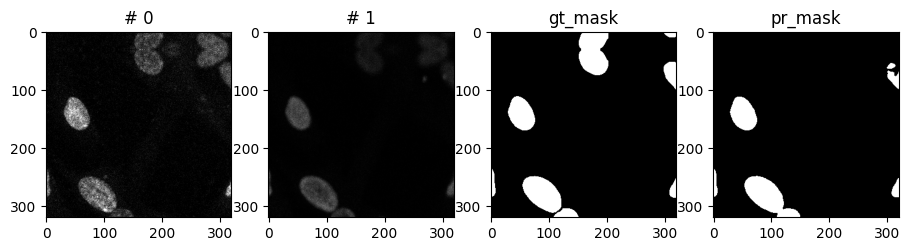

 12%|████▉                                     | 89/752 [00:26<03:20,  3.30it/s]

tensor(0.9760)


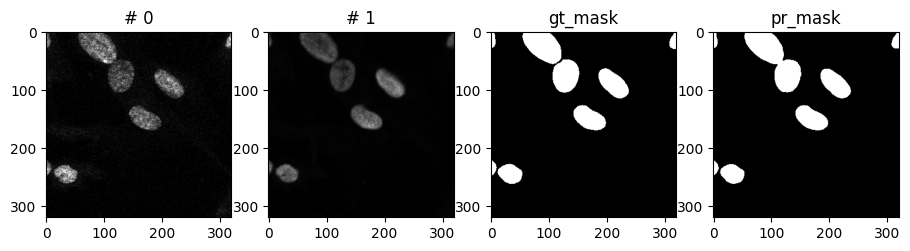

 12%|█████                                     | 90/752 [00:26<03:18,  3.34it/s]

tensor(0.9719)


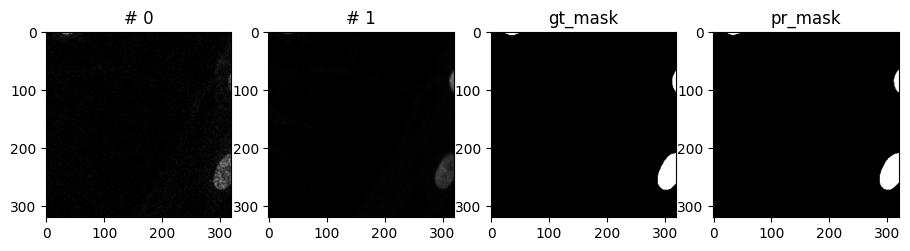

 12%|█████                                     | 91/752 [00:27<03:15,  3.38it/s]

tensor(0.9655)


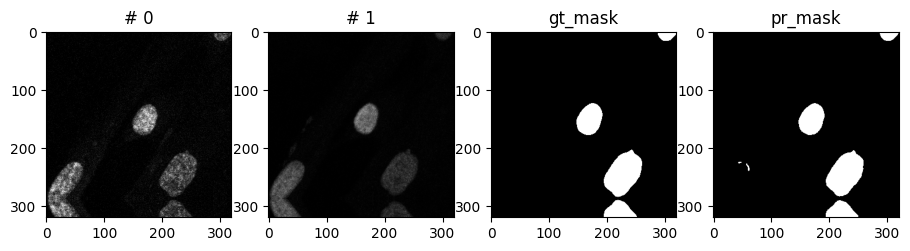

 12%|█████▏                                    | 92/752 [00:27<03:14,  3.40it/s]

tensor(0.9277)


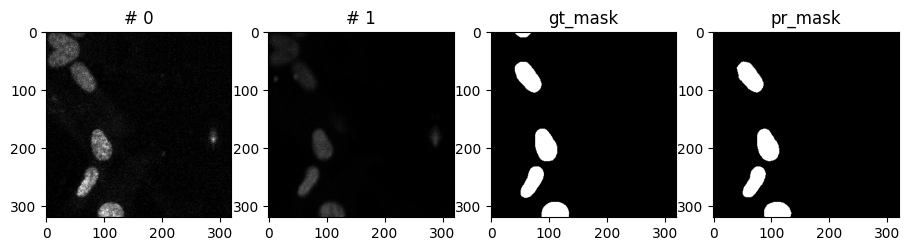

 12%|█████▏                                    | 93/752 [00:27<03:12,  3.42it/s]

tensor(0.9671)


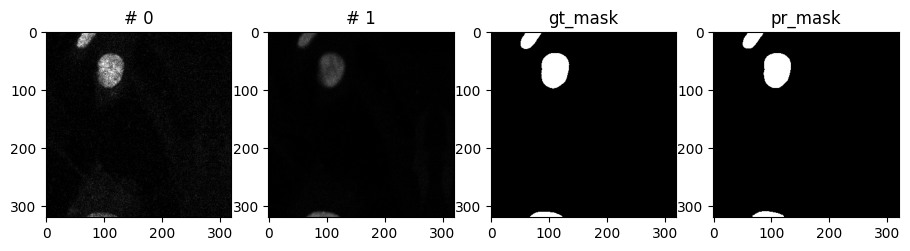

 12%|█████▎                                    | 94/752 [00:28<03:11,  3.43it/s]

tensor(0.9839)


 12%|█████▎                                    | 94/752 [00:28<03:18,  3.31it/s]


KeyboardInterrupt: 

In [8]:
# Visualize results of best saved model

test_dataset_vis = copy.deepcopy(test_dataset)
test_dataset_vis.augmentation = None
test_dataset_vis.preprocessing = None

# for i in range(5):
#     n = np.random.choice(len(test_dataset))

iou_metric_list = list()

out_dir = os.path.join(log_dir, 'results')
os.makedirs(out_dir, exist_ok=True)
for d in ['image', 'gt', 'pr', 'compare']:
    os.makedirs(os.path.join(out_dir, d), exist_ok=True)

for n in tqdm(range(len(test_dataset))):
    image, gt_mask = test_dataset[n]
    gt_mask = gt_mask.squeeze()[..., None]

    x_tensor = torch.from_numpy(image).to(p.DEVICE).unsqueeze(0)
    pr_mask = best_model.predict(x_tensor)
    pr_mask = (pr_mask.squeeze().cpu().numpy().round())[..., None]

    iou_metric = smp.utils.functional.iou(torch.from_numpy(gt_mask), torch.from_numpy(pr_mask))
    iou_metric_list.append(iou_metric)

    print(iou_metric)

    fig, ax = plt.subplots(1, p.channels + 2, figsize=figsize)
    for c_idx in range(c):
        ax[c_idx].imshow(image[c_idx], cmap='gray', vmin=0, vmax=1)
        ax[c_idx].title.set_text(f'# {c_idx}')
    ax[2].imshow(gt_mask, cmap='gray', vmin=0, vmax=1)
    ax[2].title.set_text('gt_mask')
    ax[3].imshow(pr_mask, cmap='gray', vmin=0, vmax=1)
    ax[3].title.set_text('pr_mask')
    # pprint(sq)
    plt.show()

print('DONE!')
print(f'IoU = {np.mean(iou_metric_list)}')